# ***Install required Libraries***

In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import imageio.v2 as imageio


# ***Cropping of Images***

In [ ]:

# Path to the main input folder containing subfolders
input_main_folder = '/content/drive/MyDrive/Infosys _internship/My dataset'

# Path to the main output folder for cropped faces
output_main_folder = '/content/drive/MyDrive/Infosys _internship/cropped'
os.makedirs(output_main_folder, exist_ok=True)

# Load pre-trained Haar cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Walk through all subfolders and process images
for root, subdirs, files in os.walk(input_main_folder):
    for file in files:
        # Check if the file is an image (optional: filter by extension)
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_image_path = os.path.join(root, file)

            # Construct the corresponding output folder
            relative_path = os.path.relpath(root, input_main_folder)
            output_folder = os.path.join(output_main_folder, relative_path)
            os.makedirs(output_folder, exist_ok=True)

            # Read the image
            img = cv2.imread(input_image_path)

            if img is None:
                print(f"Skipping {file}: Unable to read the image.")
                continue

            # Convert to grayscale for face detection
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # Detect faces
            faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

            # Crop and save each detected face
            for i, (x, y, w, h) in enumerate(faces):
                cropped_face = img[y:y+h, x:x+w]
                output_image_path = os.path.join(output_folder, f"{os.path.splitext(file)[0]}_face{i}.jpg")
                cv2.imwrite(output_image_path, cropped_face)

            print(f"Processed {file} in {relative_path}, detected {len(faces)} faces.")

print("Processing complete. Cropped faces are saved.")


Processed a74a74cf5cc80a21f7be36bd911d9294.jpg in vijay, detected 1 faces.
Processed 204eec79f1dd6a443492a7410afbac3f.jpg in vijay, detected 0 faces.
Processed 6f764d248f8ba7b10b3242520eebfb61.jpg in vijay, detected 0 faces.
Processed 29b35008effd7fc07396bd62a232dea6.jpg in vijay, detected 1 faces.
Processed bab3e1f43cca9b6f527bd8f8b63f91f1.jpg in vijay, detected 1 faces.
Processed a5d271ffc2a9aa906393d6c8c2037e18.jpg in vijay, detected 1 faces.
Processed e4acffae14795389e4dd1fe9614fa3f8.jpg in vijay, detected 2 faces.
Processed d32fed494b252e5531f4b77db098261c.jpg in vijay, detected 2 faces.
Processed 95a72d3cb7dfde6ef88b32a97a03e027.jpg in vijay, detected 3 faces.
Processed 012bb25f6f0e323821c44311cb8b6b7f.jpg in vijay, detected 1 faces.
Processed 8a38b8e2c672205ea04f27cd6b72c329 (1).jpg in vijay, detected 1 faces.
Processed 8a38b8e2c672205ea04f27cd6b72c329.jpg in vijay, detected 1 faces.
Processed 0523fa05284e4fbbb89cad281375fec1.jpg in vijay, detected 1 faces.
Processed 2bb9cb55258

# ***Define the main path containing all celebrity folders***

In [ ]:
cropped_face= '/content/drive/MyDrive/Infosys _internship/cropped'
preprocessed = '/content/drive/MyDrive/Infosys _internship/Output data'

# ***Ensure the output main folder exists***

In [ ]:
os.makedirs(preprocessed, exist_ok=True)


# ***Loop over each celebrity folder***

In [ ]:
celebrity_folders = [f for f in os.listdir(cropped_face) if os.path.isdir(os.path.join(cropped_face, f))]


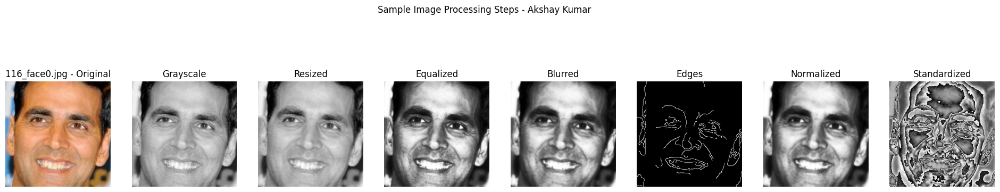

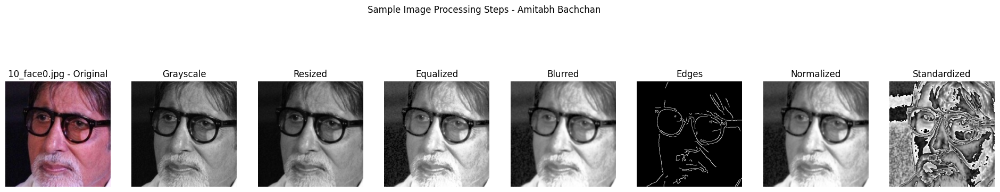

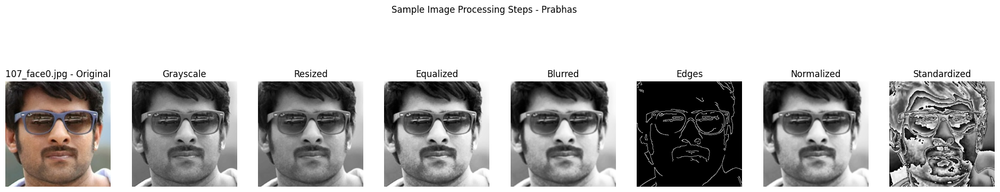

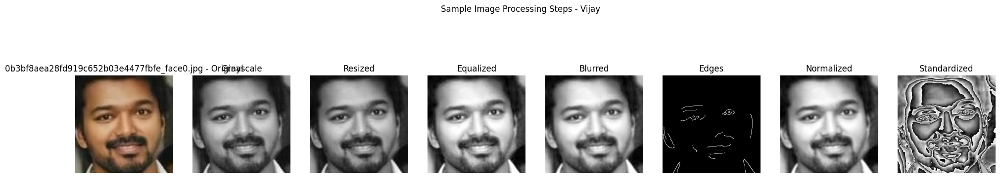

All images in all folders have been processed.


In [ ]:
for folder in celebrity_folders:
    # Define the path to the current celebrity folder
    folder_path = os.path.join(cropped_face, folder)
    output_folder = os.path.join(preprocessed, folder)  # Create a corresponding output folder for each celebrity

    # Ensure the output folder for the celebrity
    os.makedirs(output_folder, exist_ok=True)

    # ***List all image files in the current folder***
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    # Track if we've displayed a sample image for this celebrity
    displayed_sample = False

    # ***Loop over each image in the folder***
    for image_file in image_files:
        # Load the image
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)

        # Initialize a plot for the sample display
        if not displayed_sample:
            fig, axs = plt.subplots(1, 8, figsize=(24, 5))  # 8 subplots to include the original image
            fig.suptitle(f'Sample Image Processing Steps - {folder.replace("_", " ").title()}')

        # Display the Original Image
        if not displayed_sample:
            axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
            axs[0].set_title(f'{image_file} - Original')
            axs[0].axis('off')

        # Step 1: Convert to Grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        if not displayed_sample:
            axs[1].imshow(gray_image, cmap='gray')
            axs[1].set_title('Grayscale')
            axs[1].axis('off')

        # Step 2: Resize the Image
        resized_image = cv2.resize(gray_image, (300, 300))
        if not displayed_sample:
            axs[2].imshow(resized_image, cmap='gray')
            axs[2].set_title('Resized')
            axs[2].axis('off')

        # Step 3: Histogram Equalization
        equalized_image = cv2.equalizeHist(resized_image)
        if not displayed_sample:
            axs[3].imshow(equalized_image, cmap='gray')
            axs[3].set_title('Equalized')
            axs[3].axis('off')

        # Step 4: Image Smoothing (Blurring)
        blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)
        if not displayed_sample:
            axs[4].imshow(blurred_image, cmap='gray')
            axs[4].set_title('Blurred')
            axs[4].axis('off')

        # Step 5: Apply Edge Detection (Optional)
        edges = cv2.Canny(blurred_image, 100, 200)
        if not displayed_sample:
            axs[5].imshow(edges, cmap='gray')
            axs[5].set_title('Edges')
            axs[5].axis('off')

        # Step 7: Normalization
        normalized_image = blurred_image / 255.0
        if not displayed_sample:
            axs[6].imshow((normalized_image * 255).astype(np.uint8), cmap='gray')
            axs[6].set_title('Normalized')
            axs[6].axis('off')

        # Step 8: Image Standardization (Mean Subtraction and Scaling)
        mean, std = cv2.meanStdDev(normalized_image)
        standardized_image = (normalized_image - mean[0][0]) / (std[0][0] + 1e-8)
        if not displayed_sample:
            axs[7].imshow((standardized_image * 255).astype(np.uint8), cmap='gray')
            axs[7].set_title('Standardized')
            axs[7].axis('off')

        # Save the processed image in the output folder
        output_image_path = os.path.join(output_folder, f'processed_{image_file}')
        cv2.imwrite(output_image_path, (standardized_image * 255).astype(np.uint8))

        # Mark that we've displayed a sample for this celebrity
        if not displayed_sample:
            plt.show()
            displayed_sample = True

print("All images in all folders have been processed.")


# ***Data Augumentation***

In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define paths
main_folder_path = '/content/drive/MyDrive/Infosys _internship/Output data'  # Original dataset path
augmented_data_path = '/content/drive/MyDrive/Infosys _internship/Augumented data'  # Folder where augmented images will be saved

# Create the augmented data directory if it doesn't exist
os.makedirs(augmented_data_path, exist_ok=True)

# Initialize ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Loop through each subfolder (celebrity folder)
celebrity_folders = [f for f in os.listdir(main_folder_path) if os.path.isdir(os.path.join(main_folder_path, f))]
for folder in celebrity_folders:
    folder_path = os.path.join(main_folder_path, folder)

    # Create a corresponding folder in the augmented data directory for each celebrity
    augmented_folder_path = os.path.join(augmented_data_path, folder)
    os.makedirs(augmented_folder_path, exist_ok=True)

    # List all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    # Loop through each image in the folder
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)

        # Convert image to RGB for augmentation (Keras works with RGB images)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Reshape the image to fit the Keras generator
        image_array = np.expand_dims(image_rgb, axis=0)

        # Apply augmentations and save augmented images
        image_count = 0
        for x_batch in datagen.flow(image_array, batch_size=1, save_to_dir=augmented_folder_path, save_prefix=folder, save_format='jpeg'):
            image_count += 1
            if image_count >= 3:  # Save 3 augmented images for each original image
                break

print("Data augmentation complete and saved to the new folder.")


Data augmentation complete and saved to the new folder.


# Rename the **Images**

In [ ]:

# Loop over each celebrity folder
celebrity_folders = [f for f in os.listdir(augmented_data_path) if os.path.isdir(os.path.join(augmented_data_path, f))]

for folder in celebrity_folders:
    folder_path = os.path.join(augmented_data_path, folder)

    # List all image files in the current folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]

    # Loop through the image files and rename them
    for count, image_file in enumerate(image_files, start=1):
        # Extract the file extension
        file_extension = os.path.splitext(image_file)[1]

        # Construct the new filename: folder_name_count.extension
        new_image_name = f"{folder}_{str(count).zfill(3)}{file_extension}"

        # Create the full path for the new image
        new_image_path = os.path.join(folder_path, new_image_name)

        # Get the full path of the original image
        old_image_path = os.path.join(folder_path, image_file)

        # Rename the image
        os.rename(old_image_path, new_image_path)

        print(f"Renamed: {image_file} -> {new_image_name}")

print("All images have been renamed.")


Renamed: Akshay Kumar_0_4802.jpeg -> Akshay Kumar_001.jpeg
Renamed: Akshay Kumar_0_2751.jpeg -> Akshay Kumar_002.jpeg
Renamed: Akshay Kumar_0_5679.jpeg -> Akshay Kumar_003.jpeg
Renamed: Akshay Kumar_0_7726.jpeg -> Akshay Kumar_004.jpeg
Renamed: Akshay Kumar_0_3695.jpeg -> Akshay Kumar_005.jpeg
Renamed: Akshay Kumar_0_6470.jpeg -> Akshay Kumar_006.jpeg
Renamed: Akshay Kumar_0_1091.jpeg -> Akshay Kumar_007.jpeg
Renamed: Akshay Kumar_0_6038.jpeg -> Akshay Kumar_008.jpeg
Renamed: Akshay Kumar_0_9781.jpeg -> Akshay Kumar_009.jpeg
Renamed: Akshay Kumar_0_3983.jpeg -> Akshay Kumar_010.jpeg
Renamed: Akshay Kumar_0_8792.jpeg -> Akshay Kumar_011.jpeg
Renamed: Akshay Kumar_0_3787.jpeg -> Akshay Kumar_012.jpeg
Renamed: Akshay Kumar_0_4408.jpeg -> Akshay Kumar_013.jpeg
Renamed: Akshay Kumar_0_8015.jpeg -> Akshay Kumar_014.jpeg
Renamed: Akshay Kumar_0_4057.jpeg -> Akshay Kumar_015.jpeg
Renamed: Akshay Kumar_0_3732.jpeg -> Akshay Kumar_016.jpeg
Renamed: Akshay Kumar_0_6900.jpeg -> Akshay Kumar_017.jp

# ***Convert Images into Arrays***

In [ ]:
# Path to the standardized dataset
data_path = '/content/drive/MyDrive/Infosys _internship/Augumented data'

# Prepare data and labels
data = []  # To store image arrays
labels = []  # To store corresponding labels (e.g., Person1, Person2)

# Get the folder names as class labels
classes = os.listdir(data_path)

# Assign numeric labels to each class
class_mapping = {cls: idx for idx, cls in enumerate(classes)}

# Loop through each folder
for cls in classes:
    cls_folder = os.path.join(data_path, cls)
    for img_file in os.listdir(cls_folder):
        # Load image
        img_path = os.path.join(cls_folder, img_file)
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Use IMREAD_GRAYSCALE for grayscale
        image = cv2.resize(image, (224, 224))  # Resize to a fixed size (e.g., 224x224)

        # Normalize pixel values to [0, 1]
        image = image / 255.0

        # Append to data and labels
        data.append(image)
        labels.append(class_mapping[cls])

# Convert to NumPy arrays
data = np.array(data, dtype='float32')
labels = np.array(labels, dtype='int')


# ***Save the processed data and labels***

In [ ]:
# Save data and labels to files
np.save('/content/drive/MyDrive/Infosys _internship/data.npy', data)
np.save('/content/drive/MyDrive/Infosys _internship/labels.npy', labels)
print("Data and labels have been saved.")


Data and labels have been saved.


# ***Load the data and lables***

In [2]:
# Load data and labels from files
data = np.load('/content/drive/MyDrive/Infosys _internship/data.npy')
labels = np.load('/content/drive/MyDrive/Infosys _internship/labels.npy')

print("Data and labels loaded successfully.")


Data and labels loaded successfully.


# ***Print the Numpy arrays***

In [ ]:
print(f"Array Shape: {data.shape}")
print(f"Array Data:\n{data}")


Array Shape: (2837, 224, 224, 3)
Array Data:
[[[[0.68235296 0.68235296 0.68235296]
   [0.68235296 0.68235296 0.68235296]
   [0.6862745  0.6862745  0.6862745 ]
   ...
   [0.3529412  0.3529412  0.3529412 ]
   [0.32941177 0.32941177 0.32941177]
   [0.3137255  0.3137255  0.3137255 ]]

  [[0.6862745  0.6862745  0.6862745 ]
   [0.68235296 0.68235296 0.68235296]
   [0.6862745  0.6862745  0.6862745 ]
   ...
   [0.3529412  0.3529412  0.3529412 ]
   [0.33333334 0.33333334 0.33333334]
   [0.31764707 0.31764707 0.31764707]]

  [[0.6862745  0.6862745  0.6862745 ]
   [0.6784314  0.6784314  0.6784314 ]
   [0.68235296 0.68235296 0.68235296]
   ...
   [0.34901962 0.34901962 0.34901962]
   [0.33333334 0.33333334 0.33333334]
   [0.32156864 0.32156864 0.32156864]]

  ...

  [[0.3882353  0.3882353  0.3882353 ]
   [0.3882353  0.3882353  0.3882353 ]
   [0.3882353  0.3882353  0.3882353 ]
   ...
   [0.6        0.6        0.6       ]
   [0.60784316 0.60784316 0.60784316]
   [0.6392157  0.6392157  0.6392157 ]]



# ***One hot Encoding***

In [3]:
from tensorflow.keras.utils import to_categorical

# Convert labels to one-hot encoding
num_classes = 4  # Number of persons
labels_one_hot = to_categorical(labels, num_classes=num_classes)


In [ ]:
print(labels_one_hot[2500])

[0. 0. 0. 1.]


# **Split Data into Training and Validation Sets**

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(data, labels_one_hot, test_size=0.2, random_state=30)


In [ ]:
print("Training Set Shape:", X_train.shape, y_train.shape)
print("Validation Set Shape:", X_val.shape, y_val.shape)

Training Set Shape: (2269, 224, 224, 3) (2269, 4)
Validation Set Shape: (568, 224, 224, 3) (568, 4)


# ***Save the Data Split***

In [ ]:
import numpy as np

# Save the training and validation datasets
np.save('/content/drive/MyDrive/Infosys _internship/X_train.npy', X_train)
np.save('/content/drive/MyDrive/Infosys _internship/X_val.npy', X_val)
np.save('/content/drive/MyDrive/Infosys _internship/y_train.npy', y_train)
np.save('/content/drive/MyDrive/Infosys _internship/y_val.npy', y_val)

print("Data splits saved successfully.")


Data splits saved successfully.


# ***Load the Data Split***

In [4]:
# Load the saved training and validation datasets
X_train = np.load('/content/drive/MyDrive/Infosys _internship/X_train.npy')
X_val = np.load('//content/drive/MyDrive/Infosys _internship/X_val.npy')
y_train = np.load('/content/drive/MyDrive/Infosys _internship/y_train.npy')
y_val = np.load('/content/drive/MyDrive/Infosys _internship/y_val.npy')

print("Training data shape:", X_train.shape)
print("Validation data shape:", X_val.shape)


Training data shape: (2269, 224, 224, 3)
Validation data shape: (568, 224, 224, 3)


# ***Import Libraries***

In [5]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model


# ***CNN Architecture ***

In [6]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load MobileNetV2 as the base model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze the base model to retain pretrained weights

# Add custom layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Reduces feature maps to a single vector per filter
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(4, activation='softmax')(x)  # Output layer for 4 classes

# Define the complete model
cnn_model = Model(inputs=base_model.input, outputs=output)

# Compile the model for initial training
cnn_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)




9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


# ***Train the Model***

In [9]:
from tensorflow.keras.callbacks import EarlyStopping # Import EarlyStopping


from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an ImageDataGenerator with augmentation
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the generator to your training data
datagen.fit(X_train)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history = cnn_model.fit(datagen.flow(X_train, y_train,batch_size=16), validation_data=(X_val, y_val), epochs=50,  callbacks=[early_stopping])




Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


142/142 ━━━━━━━━━━━━━━━━━━━━ 163s 1s/step - accuracy: 0.2907 - loss: 1.6871 - val_accuracy: 0.5405 - val_loss: 1.1708
Epoch 2/50
142/142 ━━━━━━━━━━━━━━━━━━━━ 212s 1s/step - accuracy: 0.4114 - loss: 1.2627 - val_accuracy: 0.6373 - val_loss: 0.9689
Epoch 3/50
142/142 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - accuracy: 0.4887 - loss: 1.1627 - val_accuracy: 0.6655 - val_loss: 0.8721
Epoch 4/50
142/142 ━━━━━━━━━━━━━━━━━━━━ 147s 1s/step - accuracy: 0.5748 - loss: 1.0021 - val_accuracy: 0.6954 - val_loss: 0.8586
Epoch 5/50
142/142 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.5663 - loss: 0.9959 - val_accuracy: 0.6919 - val_loss: 0.7691
Epoch 6/50
142/142 ━━━━━━━━━━━━━━━━━━━━ 160s 1s/step - accuracy: 0.5861 - loss: 0.9504 - val_accuracy: 0.7218 - val_loss: 0.7412
Epoch 7/50
142/142 ━━━━━━━━━━━━━━━━━━━━ 206s 1s/step - accuracy: 0.5971 - loss: 0.9298 - val_accuracy: 0.7218 - val_loss: 0.7153
Epoch 8/50
142/142 ━━━━━━━━━━━━━━━━━━━━ 192s 1s/step - accuracy: 0.6565 - loss: 0.8390 - val_accuracy: 0.750

# ***Save the Trained Model***

In [10]:
cnn_model.save('/content/drive/MyDrive/Infosys _internship/face_recognition_model.keras')  # Save the model


# ***Load the Trained model***

In [11]:
from tensorflow.keras.models import load_model

cnn_model = load_model('/content/drive/MyDrive/Infosys _internship/face_recognition_model.keras')


# ***Evaluate the Model on Validation/Test Data***

In [13]:
# Evaluate on validation data
val_loss, val_accuracy = cnn_model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")


18/18 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.7516 - loss: 0.5791
Validation Loss: 0.5667366981506348
Validation Accuracy: 0.7852112650871277


# ***Fine Tune the Model***

In [30]:

# Unfreeze the base model for fine-tuning
base_model.trainable = True

# Compile the model again with a lower learning rate for fine-tuning
cnn_model.compile(
    optimizer=Adam(learning_rate=0.0005),  # Lower learning rate for fine-tuning
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Continue training (fine-tuning)
history = cnn_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=16
)



Epoch 1/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - accuracy: 0.9234 - loss: 0.2050 - val_accuracy: 0.8697 - val_loss: 0.5710
Epoch 2/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 131s 926ms/step - accuracy: 0.9175 - loss: 0.1891 - val_accuracy: 0.8680 - val_loss: 0.5429
Epoch 3/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 144s 938ms/step - accuracy: 0.9194 - loss: 0.1859 - val_accuracy: 0.8662 - val_loss: 0.4972
Epoch 4/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 148s 979ms/step - accuracy: 0.9306 - loss: 0.1644 - val_accuracy: 0.8838 - val_loss: 0.4908
Epoch 5/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 136s 932ms/step - accuracy: 0.9360 - loss: 0.1582 - val_accuracy: 0.8750 - val_loss: 0.5360
Epoch 6/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 139s 918ms/step - accuracy: 0.9410 - loss: 0.1479 - val_accuracy: 0.8785 - val_loss: 0.5507
Epoch 7/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 149s 966ms/step - accuracy: 0.9275 - loss: 0.1624 - val_accuracy: 0.8785 - val_loss: 0.4849
Epoch 8/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 133s 941ms/step - accuracy: 0.9248 - lo

# ***Save the history***

In [53]:
import pickle
with open('/content/drive/MyDrive/Infosys _internship/history.pkl', 'wb') as f:
    pickle.dump(history.history, f)


# ***Load the History***

In [32]:
import pickle
with open('/content/drive/MyDrive/Infosys _internship/history.pkl', 'rb') as f:
    history_data = pickle.load(f)
print("Training Accuracy:", history_data['accuracy'])


Training Accuracy: [0.9250771403312683, 0.914059042930603, 0.9144997596740723, 0.9219920635223389, 0.9299250841140747, 0.9330101609230042, 0.9206699132919312, 0.9246364235877991, 0.9202291965484619, 0.9202291965484619]


# Evaluate after Fine tuning

In [33]:
# Evaluate on validation data
val_loss, val_accuracy = cnn_model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.8636 - loss: 0.5743
Validation Loss: 0.5153144001960754
Validation Accuracy: 0.8785211443901062


# ***Save the fine tuned Model***

In [54]:
cnn_model.save('/content/drive/MyDrive/Infosys _internship/finetuned_model.keras')  # Save the model


# ***Load the finetuned model***

In [ ]:
from tensorflow.keras.models import load_model

cnn_model = load_model('/content/drive/MyDrive/Infosys _internship/finetuned_model.keras')

## ***Plotting the Test results***

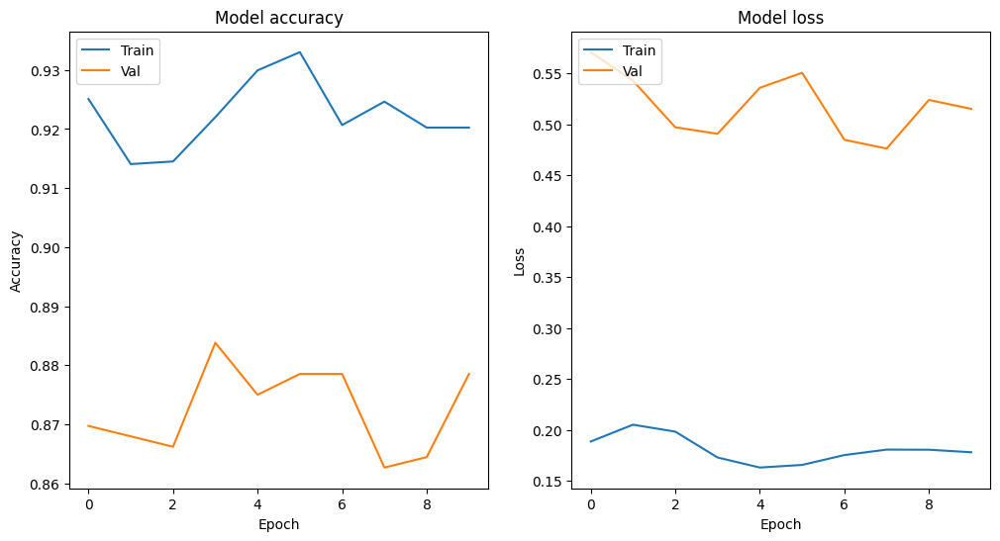

In [34]:
import matplotlib.pyplot as plt

# Assuming history contains the training history
plt.figure(figsize=(12, 6))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='upper left')

plt.show()


# ***Evaluation on Unseen data***

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


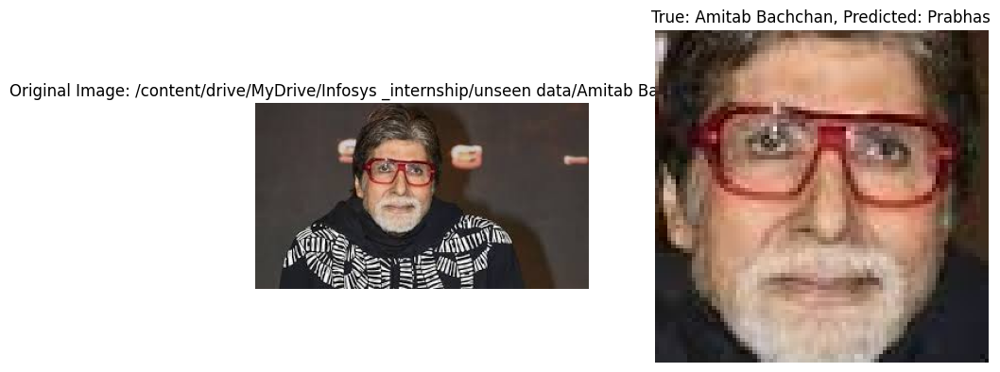

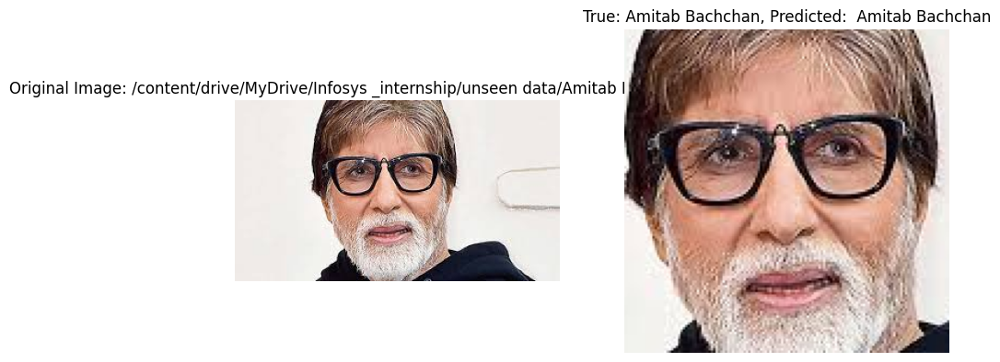

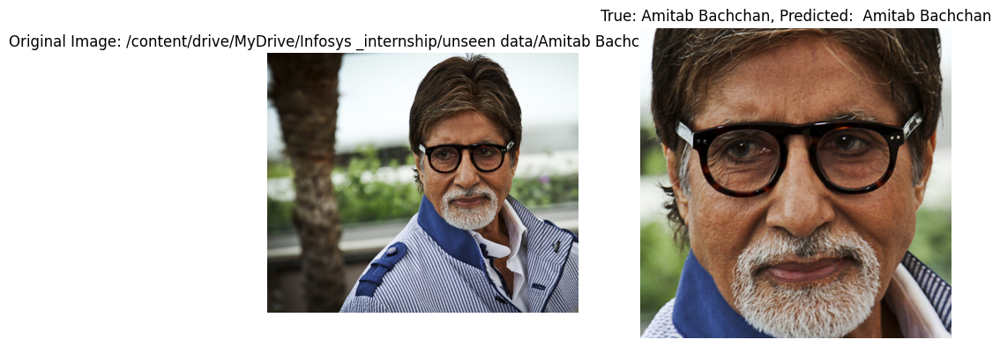

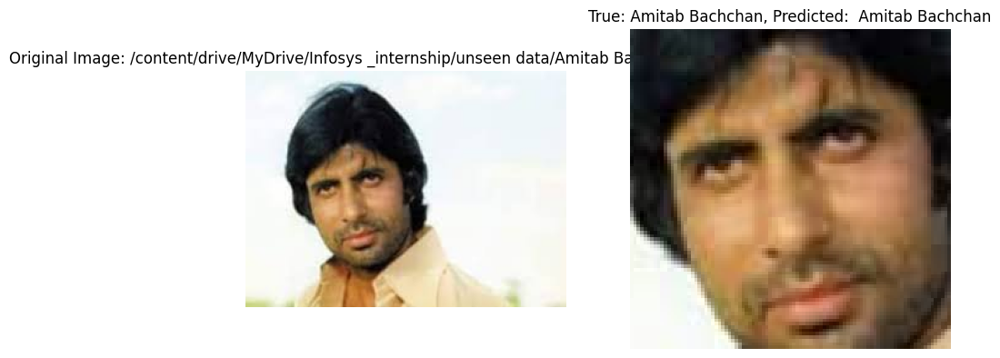

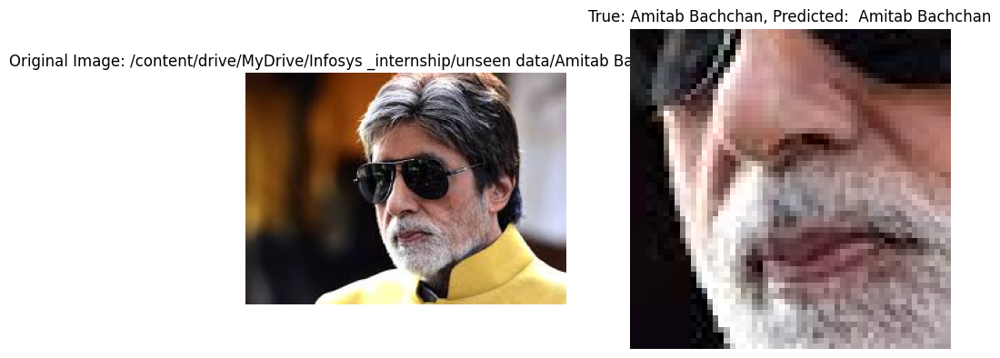

...

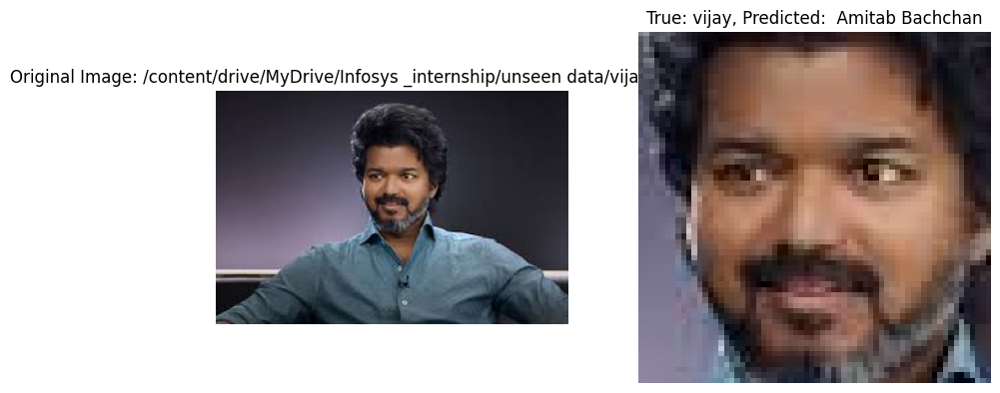

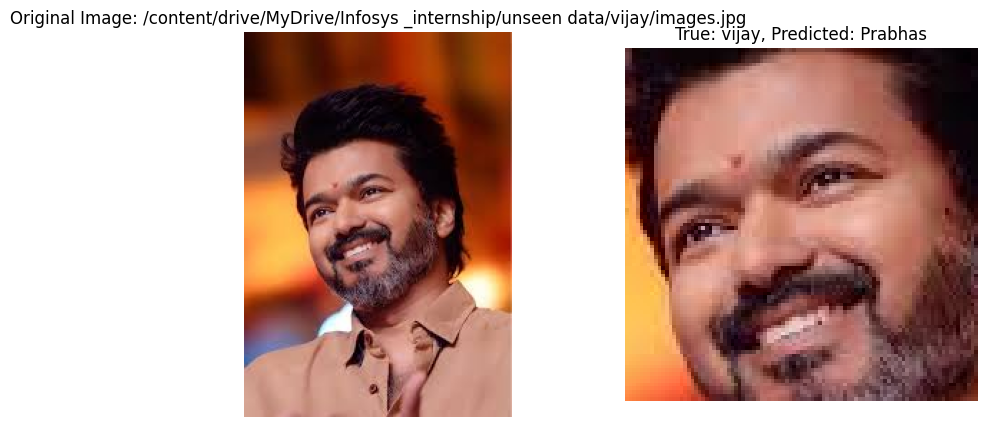

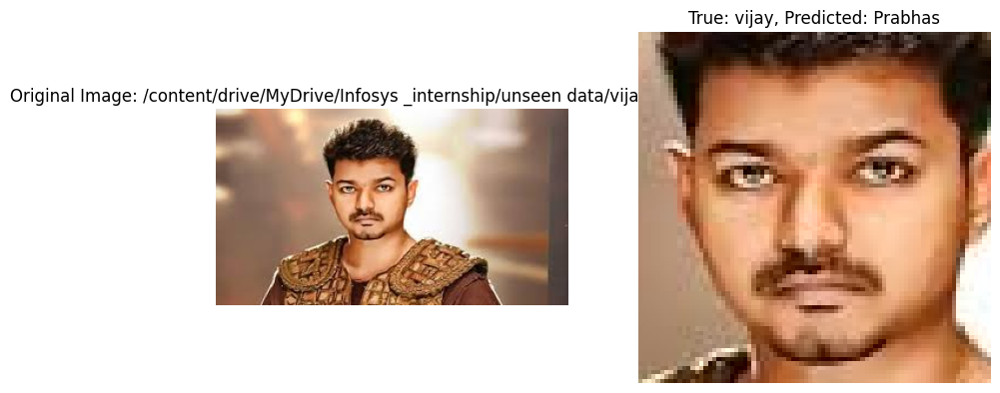

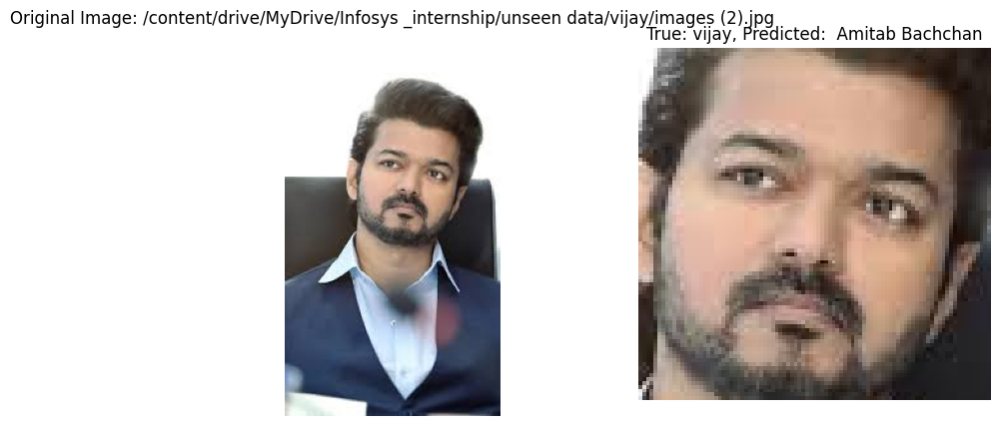

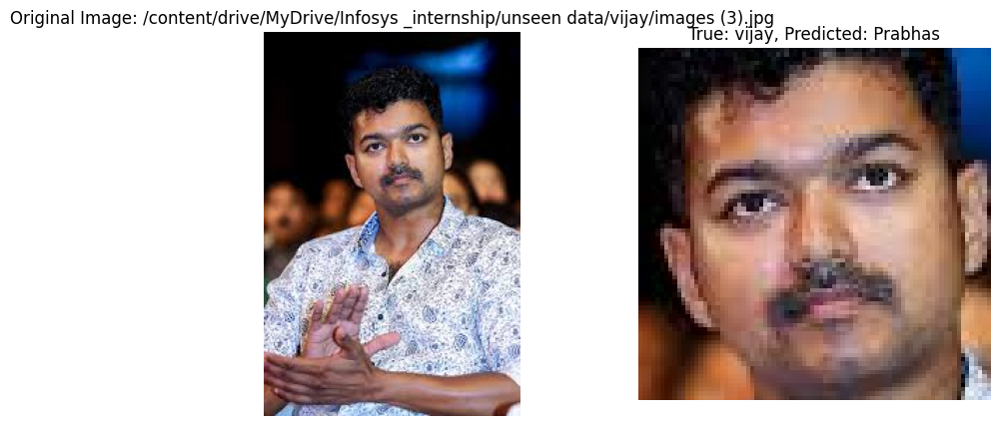

In [52]:
from tensorflow.keras.preprocessing.image import img_to_array


# Path to the unseen images folder and Haar cascade
unseen_folder_path = '/content/drive/MyDrive/Infosys _internship/unseen data'

# Load Haar Cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')


# Function to detect and crop the face
def detect_and_crop_face(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    if len(faces) == 0:
        return None, img  # No face detected, return original image

    # Crop the first detected face
    x, y, w, h = faces[0]
    cropped_face = img[y:y+h, x:x+w]
    return cropped_face, img

# Function to preprocess image with the same steps as in training
def preprocess_image(img, target_size=(224, 224)):
    # Step 1: Resize the Image
    resized_image = cv2.resize(img, (300, 300))  # Resize before color conversion

    # Step 2: Convert to RGB (if the model was trained on RGB images)
    rgb_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)  # Assuming BGR input

    # Step 3: Histogram Equalization
    equalized_image = cv2.equalizeHist(cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY))

    # Step 4: Image Smoothing (Blurring)
    blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

    # Step 5: Convert back to RGB (if necessary)
    blurred_image_rgb = cv2.cvtColor(blurred_image, cv2.COLOR_GRAY2RGB)

    # Step 6: Normalization
    normalized_image = blurred_image_rgb / 255.0

    # Step 7: Image Standardization (Mean Subtraction and Scaling)
    mean, std = cv2.meanStdDev(normalized_image)
    standardized_image = (normalized_image - mean[0][0]) / (std[0][0] + 1e-8)

    # Resize to target size for the model input
    img_resized = cv2.resize(standardized_image, target_size)
    # img_array = np.expand_dims(img_resized, axis=-1)  # Remove this line
    return img_resized  # Return the 3-channel RGB image
# Loop through subfolders for unseen data
true_labels = []
predicted_labels = []
image_paths = []
all_images = []

# --- Define class mapping for the classes you have in your dataset ---
class_mapping = {'Akshay Kumar': 0, ' Amitab Bachchan': 1, 'Prabhas': 2, 'Vijay': 3}
# ----------------------------------------------------------------------
for class_folder in os.listdir(unseen_folder_path):
    class_path = os.path.join(unseen_folder_path, class_folder)
    if os.path.isdir(class_path):  # Ensure it's a folder
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            cropped_face, original_image = detect_and_crop_face(img_path)

            if cropped_face is not None:
                processed_face = preprocess_image(cropped_face)
                all_images.append(processed_face)
                image_paths.append((img_path, original_image, cropped_face))
                true_labels.append(class_folder)

# Convert to NumPy array and reshape for the model
all_images = np.array(all_images)

# Predict classes for the cropped faces
predictions = cnn_model.predict(all_images)
predicted_classes = np.argmax(predictions, axis=1)

# Map indices to class names (adjust based on your training setup)
class_indices = {v: k for k, v in class_mapping.items()}  # Invert the mapping for prediction

# Use this mapping to interpret predictions
predicted_labels = [class_indices[idx] for idx in predicted_classes]

# Display results
for i, (img_path, original_image, cropped_face) in enumerate(image_paths):
    plt.figure(figsize=(10, 5))

    # Display original image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Original Image: {img_path}")

    # Display cropped face
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(cropped_face, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"True: {true_labels[i]}, Predicted: {predicted_labels[i]}")

    plt.show()


In [42]:
import numpy as np
from tensorflow.keras.utils import load_img, img_to_array

# Function to preprocess the input image
def preprocess_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)  # Load and resize the image
    img_array = img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize pixel values
    return img_array

# Function to predict the class of a single image
def predict_single_image(image_path, model):
    class_labels = ["akshay", "amitab", "prabhas", "vijay"]  # Define your class labels
    img_array = preprocess_image(image_path)
    prediction = cnn_model.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]
    return class_labels[predicted_class]

# Path to the input image
image_path = "/content/drive/MyDrive/Infosys _internship/Augumented data/vijay/vijay_062.jpeg"  # Replace with the actual path of your image

# Predict the class
predicted_label = predict_single_image(image_path, cnn_model)

print(f"Predicted Class: {predicted_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
Predicted Class: vijay


In [43]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Predict on validation data
y_val_pred = cnn_model.predict(X_val)
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_val_true_classes = np.argmax(y_val, axis=1)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_val_true_classes, y_val_pred_classes)
print("Confusion Matrix:\n", conf_matrix)

# Generate classification report
class_report = classification_report(y_val_true_classes, y_val_pred_classes, target_names=['akshay', 'amitab', 'prabhas', 'vijay'])
print("Classification Report:\n", class_report)


18/18 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step
Confusion Matrix:
 [[119   4  10   4]
 [  4 102   3   1]
 [ 12   0 123  16]
 [  2   4   9 155]]
Classification Report:
               precision    recall  f1-score   support

      akshay       0.87      0.87      0.87       137
      amitab       0.93      0.93      0.93       110
     prabhas       0.85      0.81      0.83       151
       vijay       0.88      0.91      0.90       170

    accuracy                           0.88       568
   macro avg       0.88      0.88      0.88       568
weighted avg       0.88      0.88      0.88       568



In [46]:
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array

def preprocess_consistent_with_training(img_path, target_size=(224, 224)):
    # Step 1: Load the image
    img = cv2.imread(img_path)

    # Step 2: Convert to grayscale
    gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Step 3: Resize the image
    resized_image = cv2.resize(gray_image, (300, 300))

    # Step 4: Histogram Equalization
    equalized_image = cv2.equalizeHist(resized_image)

    # Step 5: Gaussian Blurring
    blurred_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

    # Step 6: Normalize the image (values between 0 and 1)
    normalized_image = blurred_image / 255.0

    # Step 7: Standardization (mean subtraction and scaling)
    mean, std = cv2.meanStdDev(normalized_image)
    standardized_image = (normalized_image - mean[0][0]) / (std[0][0] + 1e-8)

    # Step 8: Resize to target size for the model
    final_image = cv2.resize(standardized_image, target_size)

    # Convert back to 3D array format for model input
    final_image_array = np.expand_dims(final_image, axis=-1)  # Add channel dimension
    final_image_array = np.repeat(final_image_array, 3, axis=-1)  # Repeat channels to match model input shape
    return final_image_array

# Path to the example image
example_image_path = '/content/drive/MyDrive/Infosys _internship/cropped/Akshay Kumar/104_face0.jpg'

# Preprocess the image
processed_image = preprocess_consistent_with_training(example_image_path, target_size=(224, 224))

# Expand dimensions for batch input
image_array = np.expand_dims(processed_image, axis=0)

# Predict using the model
prediction = cnn_model.predict(image_array)
print("Predicted class:", np.argmax(prediction))



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
Predicted class: 0


In [49]:
predictions = cnn_model.predict(X_train[:10])  # Predict on the first 10 training images
predicted_classes = np.argmax(predictions, axis=1)
actual_classes = np.argmax(y_train[:10], axis=1)
print("Predicted:", predicted_classes)
print("Actual:", actual_classes)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
Predicted: [2 1 2 0 3 2 2 2 0 1]
Actual: [2 1 2 0 3 2 2 2 0 1]


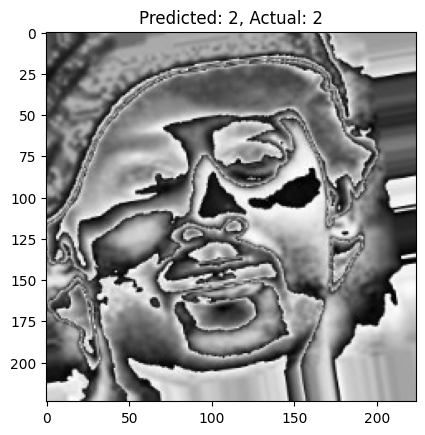

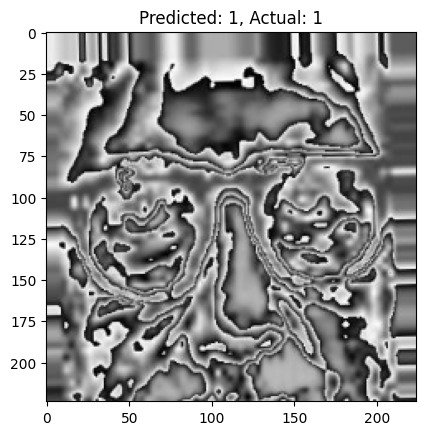

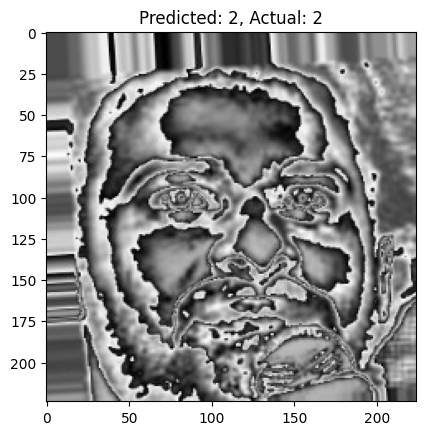

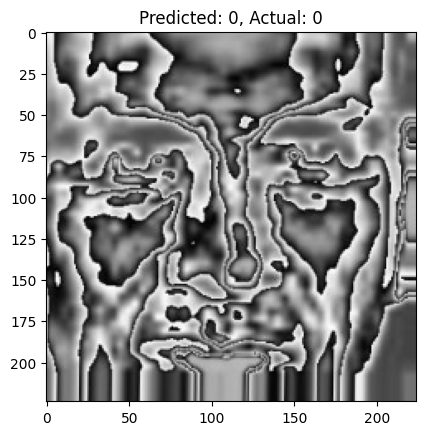

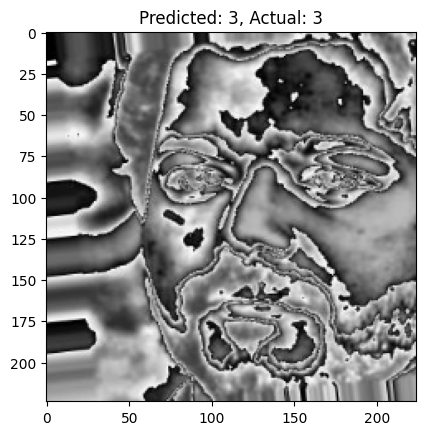

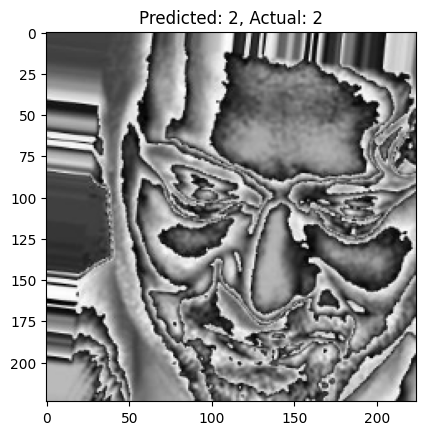

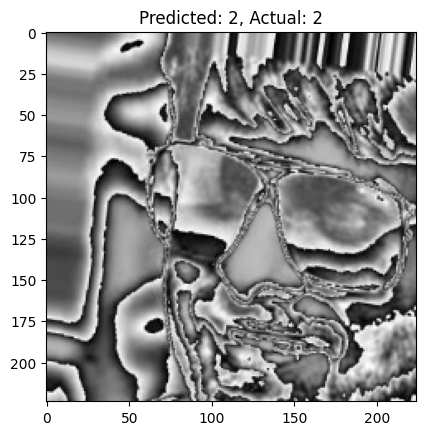

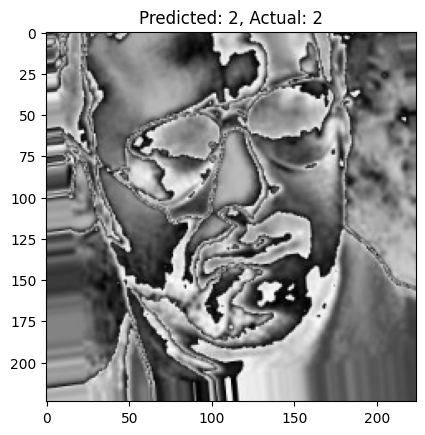

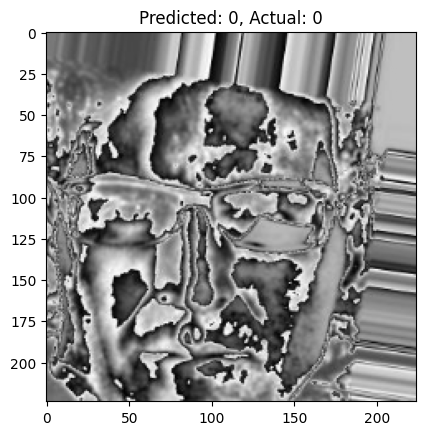

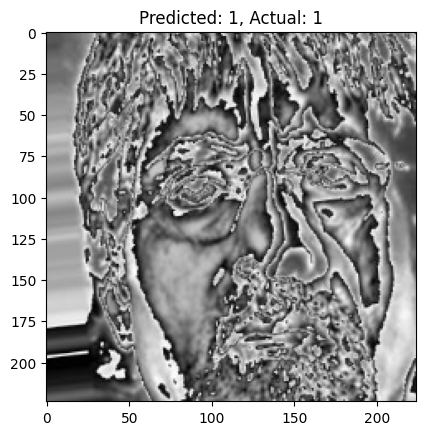

In [50]:
import matplotlib.pyplot as plt
for i, img in enumerate(X_train[:10]):
    plt.imshow(img)
    plt.title(f"Predicted: {predicted_classes[i]}, Actual: {actual_classes[i]}")
    plt.show()


In [51]:
from tensorflow.keras.callbacks import LearningRateScheduler
def lr_schedule(epoch, lr):
    return lr * 0.95  # Reduce learning rate by 5% every epoch

scheduler = LearningRateScheduler(lr_schedule)
history = cnn_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=16,
    callbacks=[scheduler]
)


Epoch 1/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 136s 959ms/step - accuracy: 0.9248 - loss: 0.1759 - val_accuracy: 0.8838 - val_loss: 0.5207 - learning_rate: 4.7500e-04
Epoch 2/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 119s 793ms/step - accuracy: 0.9318 - loss: 0.1793 - val_accuracy: 0.8768 - val_loss: 0.5152 - learning_rate: 4.5125e-04
Epoch 3/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 146s 821ms/step - accuracy: 0.9415 - loss: 0.1478 - val_accuracy: 0.8715 - val_loss: 0.5182 - learning_rate: 4.2869e-04
Epoch 4/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 145s 841ms/step - accuracy: 0.9316 - loss: 0.1610 - val_accuracy: 0.8732 - val_loss: 0.5375 - learning_rate: 4.0725e-04
Epoch 5/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 140s 829ms/step - accuracy: 0.9294 - loss: 0.1635 - val_accuracy: 0.8838 - val_loss: 0.5496 - learning_rate: 3.8689e-04
Epoch 6/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 130s 921ms/step - accuracy: 0.9438 - loss: 0.1355 - val_accuracy: 0.8979 - val_loss: 0.5392 - learning_rate: 3.6755e-04
Epoch 7/10
142/142 ━━━━━━━━━━━━━━━━━━━━ 